# EV Charging Infrastructure Data Collection and Exploration

This notebook handles comprehensive data collection and validation from multiple authoritative sources:

1. Population and Demographics

2. Geographic and infrastructure Data:
   - KWC-CMA boundary
   - Census tract boundaries
   - Land use and zoning patterns
   - Transportation Networks

3. Existing charging infrastructure:
   - Existing charging stations
   - Potential locations for new stations

Sources:
- [Region of Waterloo Open Data](https://rowopendata-rmw.opendata.arcgis.com/) (Primary source)
- [Statistics Canada Census 2021](https://www12.statcan.gc.ca/census-recensement/index-eng.cfm) (Validation)
- [UN Data](https://data.un.org/Data.aspx?d=POP&f=tableCode%3a240%3bcountryCode%3a124&c=2,3,6,8,10,12,14,16,17,18&s=_countryEnglishNameOrderBy:asc,refYear:desc,areaCode:asc&v=1) (Trend validation)
- [Data Commons](https://datacommons.org/place/wikidataId/Q175735) (Additional validation)
- [OpenStreetMap](https://www.openstreetmap.org/relation/2062151) (Geographic context)
- [OpenChargeMap](https://openchargemap.org/site)

In [39]:
# Setup and imports
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import folium
from datetime import datetime
import logging
import warnings
import json
from IPython.display import display, HTML
import time

# Local imports
from src.data.population_processor import PopulationDataProcessor
from src.data.api_client import APIClient
from src.data.data_fetcher import KWDataFetcher
from src.data.constants import *
from src.data.utils import *
from src.visualization import map_viz

# Configure logging and warnings
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)
warnings.filterwarnings('ignore', category=UserWarning)

# Initialize processors
pop_processor = PopulationDataProcessor()
api_client = APIClient()
data_fetcher = KWDataFetcher()

print("Setup complete!")

Setup complete!


## 1. Region Definition and Base Data
First, let's establish our study area and collect base geographic data.

In [40]:
# Fetch KWC-CMA boundary and create base map
print("Fetching KWC-CMA boundary...")
try:
    cma_boundary = pop_processor.get_cma_boundary()
    
    # Clean up redundant columns
    cols_to_keep = ['geometry', 'ShortName', 'LongName']
    cma_boundary = cma_boundary[cols_to_keep]
    
    # Calculate actual area using geodesic calculations
    area_km2 = float(cma_boundary.to_crs({'proj':'cea'}).geometry.area.sum() / 1_000_000)  # Convert m² to km²
    
    # Display region information
    print(f"\nStudy Area Information:")
    print(f"Total Area: {area_km2:.1f} km²")
    print(f"Name: {cma_boundary['LongName'].iloc[0]}")
    
    # Get actual bounds
    bounds = cma_boundary.total_bounds
    print(f"\nBounds:")
    print(f"- North: {bounds[3]:.4f}")
    print(f"- South: {bounds[1]:.4f}")
    print(f"- East:  {bounds[2]:.4f}")
    print(f"- West:  {bounds[0]:.4f}")
    
    # Create base map centered on region
    centroid = cma_boundary.geometry.centroid.iloc[0]
    m = folium.Map(
        location=[centroid.y, centroid.x],
        zoom_start=10,
        tiles='cartodbpositron'
    )
    
    # Add CMA boundary
    folium.GeoJson(
        cma_boundary.__geo_interface__,
        name='KWC-CMA Boundary',
        style_function=lambda x: {
            'color': 'red',
            'weight': 2,
            'fillColor': '#3186cc',
            'fillOpacity': 0.1
        },
        tooltip=folium.GeoJsonTooltip(
            fields=['ShortName', 'LongName'],
            aliases=['Name', 'Full Name'],
            style=("background-color: white; "
                  "border: 2px solid black; "
                  "border-radius: 3px; "
                  "box-shadow: 3px")
        )
    ).add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    # Explicitly display the map
    print("\nDisplaying map...")
    display(m)

except Exception as e:
    print(f"Error: {str(e)}")
    print("Please check the data format and structure of the boundary GeoDataFrame.")
    print("\nBoundary DataFrame Info:")
    if 'cma_boundary' in locals():
        print("\nColumns:")
        print(cma_boundary.columns.tolist())
        print("\nShape:", cma_boundary.shape)

INFO:src.data.population_processor:Loading CMA boundary from cache...
INFO:src.data.population_processor:Successfully loaded boundary from cache


Fetching KWC-CMA boundary...

Study Area Information:
Total Area: 1384.1 km²
Name: Regional Municipality of Waterloo

Bounds:
- North: 43.6896
- South: 43.2668
- East:  -80.1893
- West:  -80.8690

Displaying map...


## 2. Comprehensive Data Collection
Now let's collect and integrate data from all available sources.

In [41]:
import warnings
import logging

# Configure logging to be less verbose
logging.getLogger('src.data.data_fetcher').setLevel(logging.WARNING)

# Suppress specific warnings
warnings.filterwarnings('ignore', category=UserWarning, module='fiona')
warnings.filterwarnings('ignore', category=UserWarning, module='pyproj')
warnings.filterwarnings('ignore', message='.*geometries outside region bounds.*')

# Define color codes for prettier output
COLORS = {
    'GREEN': '\033[92m',
    'RED': '\033[91m',
    'BLUE': '\033[94m',
    'YELLOW': '\033[93m',
    'ENDC': '\033[0m',
    'BOLD': '\033[1m'
}

# Define datasets to collect
datasets = {
    'Census Data': {
        'housing': 'census',
        'income': 'census',
        'labour': 'census'
    },
    'Infrastructure': {
        'roads': 'infrastructure',
        'trails': 'infrastructure',
        'parking': 'infrastructure',
        'buildings': 'infrastructure',
        'poi': 'infrastructure'
    },
    'Land Use': {
        'business_park': 'land_use',
        'business_areas': 'land_use',
        'downtown': 'land_use',
        'parks': 'land_use'
    },
    'Transportation': {
        'grt_stops': 'transportation',
        'ion_routes': 'transportation',
        'ion_stops': 'transportation'
    }
}

print(f"{COLORS['BOLD']}Collecting regional data for the KWC-CMA region...{COLORS['ENDC']}")
print("=" * 80)

collected_data = {}
collection_summary = {category: {'success': 0, 'total': len(datasets)} 
                     for category, datasets in datasets.items()}

# Special handling for GRT routes due to its unique coordinate structure
collection_summary['Transportation']['total'] += 1  # Add GRT routes to total

# Collect data by category
for category, category_datasets in datasets.items():
    print(f"\n📂 {COLORS['BOLD']}{category}:{COLORS['ENDC']}")
    collected_data[category] = {}
    
    # Special handling for Transportation category
    if category == 'Transportation':
        # Handle GRT routes first with special processing
        try:
            print(f"  {'⏳':2} {'grt_routes':<20}", end='', flush=True)
            data = data_fetcher.fetch_grt_routes()
            collected_data[category]['grt_routes'] = data
            print(f"\r  {COLORS['GREEN']}✓{COLORS['ENDC']}  {'grt_routes':<20} {COLORS['BLUE']}({len(data):,} records){COLORS['ENDC']}")
            collection_summary[category]['success'] += 1
        except Exception as e:
            print(f"\r  {COLORS['RED']}✗{COLORS['ENDC']}  {'grt_routes':<20} {COLORS['RED']}Failed: {str(e)}{COLORS['ENDC']}")
            collected_data[category]['grt_routes'] = None
    
    # Process regular datasets
    for name, endpoint_type in category_datasets.items():
        try:
            print(f"  {'⏳':2} {name:<20}", end='', flush=True)
            data = data_fetcher.fetch_data(endpoint_type, name)  # Removed show_progress parameter
            collected_data[category][name] = data
            print(f"\r  {COLORS['GREEN']}✓{COLORS['ENDC']}  {name:<20} {COLORS['BLUE']}({len(data):,} records){COLORS['ENDC']}")
            collection_summary[category]['success'] += 1
        except Exception as e:
            print(f"\r  {COLORS['RED']}✗{COLORS['ENDC']}  {name:<20} {COLORS['RED']}Failed: {str(e)}{COLORS['ENDC']}")
            collected_data[category][name] = None

# Show collection summary
print(f"\n{COLORS['BOLD']}Collection Summary:{COLORS['ENDC']}")
print("=" * 80)
total_success = 0
total_datasets = 0

for category, summary in collection_summary.items():
    success_rate = (summary['success'] / summary['total']) * 100
    color = COLORS['GREEN'] if success_rate == 100 else COLORS['YELLOW'] if success_rate >= 75 else COLORS['RED']
    print(f"{category:15} {color}{summary['success']:2}/{summary['total']:2} datasets collected ({success_rate:5.1f}%){COLORS['ENDC']}")
    total_success += summary['success']
    total_datasets += summary['total']

overall_rate = (total_success / total_datasets) * 100
print("-" * 80)
color = COLORS['GREEN'] if overall_rate >= 90 else COLORS['YELLOW'] if overall_rate >= 75 else COLORS['RED']
print(f"Overall Success Rate: {color}{total_success}/{total_datasets} datasets ({overall_rate:.1f}%){COLORS['ENDC']}")

# Show cache statistics
print(f"\n{COLORS['BOLD']}Cache Statistics:{COLORS['ENDC']}")
print("=" * 80)
cache_info = data_fetcher.get_cache_info()

# Group by type
grouped_cache = cache_info.groupby('type').agg({
    'size_kb': ['count', 'sum', 'mean']
}).round(2)

# Rename columns
grouped_cache.columns = ['Files', 'Total Size (KB)', 'Avg Size (KB)']

# Add total row
total_row = pd.DataFrame({
    'Files': [grouped_cache['Files'].sum()],
    'Total Size (KB)': [grouped_cache['Total Size (KB)'].sum()],
    'Avg Size (KB)': [grouped_cache['Total Size (KB)'].sum() / grouped_cache['Files'].sum()]
}, index=['Total'])

grouped_cache = pd.concat([grouped_cache, total_row])

print(grouped_cache.to_string())
print(f"\nTotal Cache Size: {grouped_cache.loc['Total', 'Total Size (KB)']/1024:.2f} MB")

# Show data quality metrics if needed
if hasattr(data_fetcher, 'get_warning_counts') and any(warning_counts := data_fetcher.get_warning_counts()):
    print(f"\n{COLORS['BOLD']}Data Quality Warnings:{COLORS['ENDC']}")
    print("=" * 80)
    for warning_type, count in warning_counts.items():
        print(f"{COLORS['YELLOW']}• {warning_type}: {count} datasets affected{COLORS['ENDC']}")

print(f"\n{COLORS['BOLD']}All data collection completed. Ready for analysis.{COLORS['ENDC']}")


📂 Census Data:
  ✓  housing              (380 records)
  ✓  income               (380 records)
  ✓  labour               (380 records)

📂 Infrastructure:
  ✓  roads                (2,000 records)
  ✓  trails               (2,000 records)
  ✓  parking              (46 records)
  ✓  buildings            (2,000 records)
  ✓  poi                  (114 records)

📂 Land Use:
  ✓  business_park        (4 records)
  ✓  business_areas       (2 records)
  ✓  downtown             (8 records)
  ✓  parks                (533 records)

📂 Transportation:
  ✓  grt_routes           (72 records)
  ⏳  grt_stops           

  ✓  grt_stops            (1,000 records)
  ✓  ion_routes           (155 records)
  ✓  ion_stops            (35 records)

Collection Summary:
Census Data      3/ 3 datasets collected (100.0%)
Infrastructure   5/ 5 datasets collected (100.0%)
Land Use         4/ 4 datasets collected (100.0%)
Transportation   4/ 4 datasets collected (100.0%)
--------------------------------------------------------------------------------
Overall Success Rate: 16/16 datasets (100.0%)

Cache Statistics:
                Files  Total Size (KB)  Avg Size (KB)
census              3          9022.42    3007.470000
infrastructure      5         10396.73    2079.350000
land_use            4          2204.19     551.050000
transportation     10          2890.75     289.080000
Total              22         24514.09    1114.276818

Total Cache Size: 23.94 MB

All data collection completed. Ready for analysis.


## 3. Population Distribution Analysis
Let's analyze population density and demographic patterns across the KWC-CMA region to identify areas of high EV charging demand.

Creating population distribution analysis...


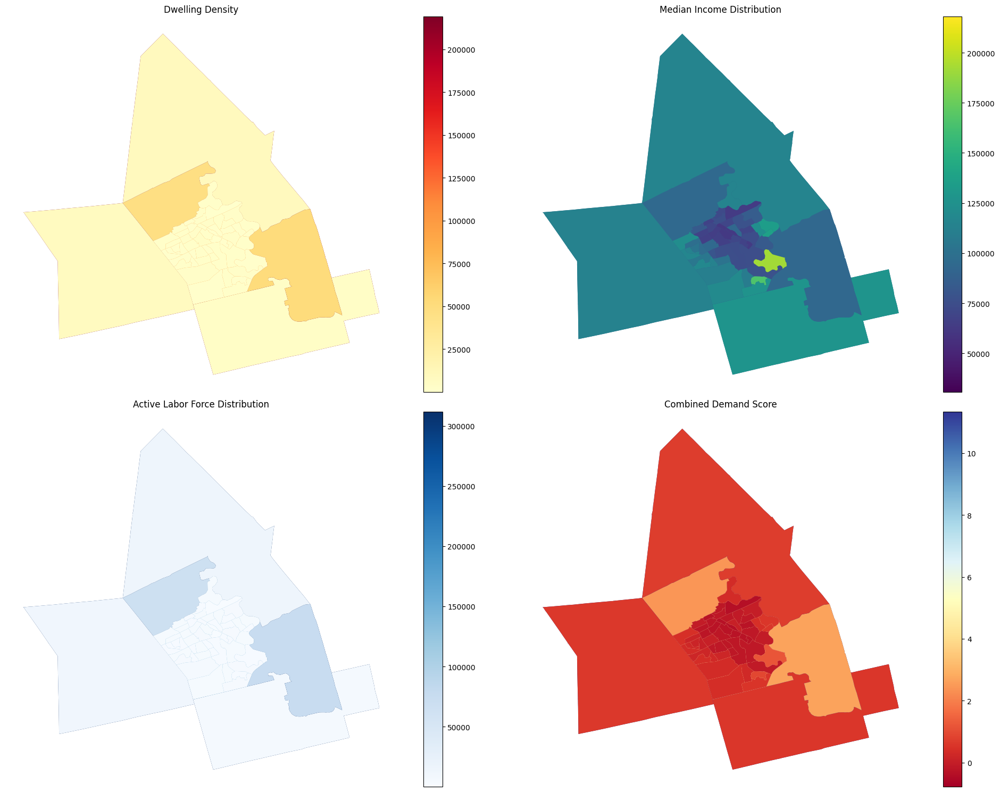


Regional Statistics:
Total Population (based on dwellings): 637,730
Average Household Size: 1682.66
Median Household Income: $85,000
Active Labor Force: 903,285


In [42]:
# Create demographic analysis maps
census_data = collected_data['Census Data']

print("Creating population distribution analysis...")
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 15))

# Population Density
base = census_data['housing'].plot(
    column='TOTAL_DWELLINGS',
    cmap='YlOrRd',
    legend=True,
    ax=ax1
)
ax1.set_title('Dwelling Density')
ax1.axis('off')

# Income Distribution
census_data['income'].plot(
    column='MEDIAN_INCOME',
    cmap='viridis',
    legend=True,
    ax=ax2
)
ax2.set_title('Median Income Distribution')
ax2.axis('off')

# Employment Patterns
census_data['labour'].plot(
    column='ACTIVE_LABOUR_FORCE',
    cmap='Blues',
    legend=True,
    ax=ax3
)
ax3.set_title('Active Labor Force Distribution')
ax3.axis('off')

# Combined Score (normalized sum of above factors)
combined_data = census_data['housing'].copy()
combined_data['income_norm'] = (census_data['income']['MEDIAN_INCOME'] - 
                              census_data['income']['MEDIAN_INCOME'].mean()) / census_data['income']['MEDIAN_INCOME'].std()
combined_data['labor_norm'] = (census_data['labour']['ACTIVE_LABOUR_FORCE'] - 
                             census_data['labour']['ACTIVE_LABOUR_FORCE'].mean()) / census_data['labour']['ACTIVE_LABOUR_FORCE'].std()
combined_data['dwelling_norm'] = (combined_data['TOTAL_DWELLINGS'] - 
                                combined_data['TOTAL_DWELLINGS'].mean()) / combined_data['TOTAL_DWELLINGS'].std()
combined_data['demand_score'] = (combined_data['income_norm'] + 
                               combined_data['labor_norm'] + 
                               combined_data['dwelling_norm']) / 3

combined_data.plot(
    column='demand_score',
    cmap='RdYlBu',
    legend=True,
    ax=ax4
)
ax4.set_title('Combined Demand Score')
ax4.axis('off')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nRegional Statistics:")
print("=" * 80)
print(f"Total Population (based on dwellings): {int(census_data['housing']['TOTAL_DWELLINGS'].sum()):,}")
print(f"Average Household Size: {combined_data['TOTAL_DWELLINGS'].mean():.2f}")
print(f"Median Household Income: ${int(census_data['income']['MEDIAN_INCOME'].median()):,}")
print(f"Active Labor Force: {int(census_data['labour']['ACTIVE_LABOUR_FORCE'].sum()):,}")

## 4. Infrastructure Coverage Analysis
Now let's analyze the coverage of existing infrastructure and identify gaps.

In [43]:
# Create base map
m = folium.Map(
    location=[43.4516, -80.4925],
    zoom_start=11,
    tiles='cartodbpositron'
)

# Add infrastructure layers

infrastructure = collected_data['Infrastructure']
transportation = collected_data['Transportation']

# Add existing charging stations (if available)
# This would come from your charging station data source

# Add major roads
folium.GeoJson(
    infrastructure['roads'].__geo_interface__,
    name='Major Roads',
    style_function=lambda x: {
        'color': 'gray',
        'weight': 1,
        'opacity': 0.5
    }
).add_to(m)

# Add transit routes
if transportation['grt_routes'] is not None:
    folium.GeoJson(
        transportation['grt_routes'].__geo_interface__,
        name='GRT Routes',
        style_function=lambda x: {
            'color': 'blue',
            'weight': 2
        }
    ).add_to(m)

# Add ION routes
folium.GeoJson(
    transportation['ion_routes'].__geo_interface__,
    name='ION Routes',
    style_function=lambda x: {
        'color': 'red',
        'weight': 3
    }
).add_to(m)

# Add stops
for stop in transportation['grt_stops'].itertuples():
    popup_html = f"""
        <div style="font-family: Arial; max-width: 300px;">
            <h4 style="margin-bottom: 5px;">{stop.StopID}</h4>
            <p style="margin: 2px 0;"><b>EasyGo:</b> {stop.EasyGo}</p>
            <p style="margin: 2px 0;"><b>Street:</b> {stop.Street}</p>
            <p style="margin: 2px 0;"><b>Cross Street:</b> {stop.CrossStreet}</p>
            <p style="margin: 2px 0;"><b>Municipality:</b> {stop.Municipality}</p>
            <p style="margin: 2px 0;"><b>Status:</b> {stop.Status}</p>
            <hr style="margin: 2px 0;">
            <p style="margin: 2px 0;"><small>Coordinates: {stop.geometry.y:.4f}, {stop.geometry.x:.4f}</small></p>
        </div>
        """
    folium.CircleMarker(
        location=[stop.geometry.y, stop.geometry.x],
        radius=3,
        color='blue',
        fill=True,
        popup=folium.Popup(popup_html, max_width=300)
    ).add_to(m)

for stop in transportation['ion_stops'].itertuples():
    popup_html = f"""
        <div style="font-family: Arial; max-width: 300px;">
            <h4 style="margin-bottom: 5px;">{stop.StopName}</h4>
            <p style="margin: 2px 0;"><b>Municipality:</b> {stop.Municipality}</p>
            <p style="margin: 2px 0;"><b>Location:</b> {stop.StopLocation}</p>
            <p style="margin: 2px 0;"><b>Status:</b> {stop.StopStatus}</p>
            <p style="margin: 2px 0;"><b>Stage 1:</b> {stop.Stage1}</p>
            <p style="margin: 2px 0;"><b>Stage 2:</b> {stop.Stage2}</p>
            <p style="margin: 2px 0;"><b>Phase:</b> {stop.Phase}</p>
            <p style="margin: 2px 0;"><b>Direction:</b> {stop.StopDirection}</p>
            <hr style="margin: 2px 0;">
            <p style="margin: 2px 0;"><small>Coordinates: {stop.geometry.y:.4f}, {stop.geometry.x:.4f}</small></p>
        </div>
        """
    folium.CircleMarker(
        location=[stop.geometry.y, stop.geometry.x],
        radius=5,
        color='red',
        fill=True,
        popup=folium.Popup(popup_html, max_width=300)
    ).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

m

In [44]:
# Calculate coverage statistics
print("Infrastructure Coverage Analysis:")
print("=" * 80)

# Transportation coverage
total_area = float(census_data['housing'].geometry.area.sum())
transit_stops = len(transportation['grt_stops'])
ion_stops = len(transportation['ion_stops'])
transit_coverage = transit_stops / total_area
ion_coverage = ion_stops / total_area

print(f"\nTransportation Coverage:")
print(f"Total Area: {total_area/1_000_000:.1f} km²")

print(f"\nTransit Stops:")
print(f"Total GRT Stops: {transit_stops}")
print(f"Total ION Stops: {ion_stops}")

print(f"\nCoverage:")
print(f"GRT Stops per km²: {transit_coverage:.4f}")
print(f"ION Stops per km²: {ion_coverage:.4f}")

transit_routes_length = float(transportation['grt_routes'].geometry.length.sum() if transportation['grt_routes'] is not None else 0)
ion_routes_length = float(transportation['ion_routes'].geometry.length.sum())
road_length = float(infrastructure['roads'].geometry.length.sum())

print(f"\nTransportation Network:")
print(f"Total Road Length: {road_length/1000:.1f} km")
print(f"Transit Route Length: {transit_routes_length/1000:.1f} km")
print(f"ION Route Length: {ion_routes_length/1000:.1f} km")
print(f"Transit Stops: {len(transportation['grt_stops'])}")
print(f"ION Stops: {len(transportation['ion_stops'])}")

Infrastructure Coverage Analysis:

Transportation Coverage:
Total Area: 0.0 km²

Transit Stops:
Total GRT Stops: 1000
Total ION Stops: 35

Coverage:
GRT Stops per km²: 3611.8968
ION Stops per km²: 126.4164

Transportation Network:
Total Road Length: 0.0 km
Transit Route Length: 0.0 km
ION Route Length: 0.0 km
Transit Stops: 1000
ION Stops: 35


In [53]:
# %% [markdown]
# ## 5. Potential Location Analysis
# Let's analyze potential locations for new charging stations based on multiple factors.

# %%
# Create potential location scoring function
def score_location(point, census_data, infrastructure, transportation):
    """Score a potential location based on multiple factors."""
    score = 0
    
    # Population density score (30%)
    pop_density = census_data['housing'].geometry.contains(point)
    if pop_density.any():
        tract_idx = pop_density[pop_density].index[0]
        score += (census_data['housing'].loc[tract_idx, 'TOTAL_DWELLINGS'] / 
                 census_data['housing']['TOTAL_DWELLINGS'].max()) * 30
    
    # Income score (20%)
    income_density = census_data['income'].geometry.contains(point)
    if income_density.any():
        tract_idx = income_density[income_density].index[0]
        score += (census_data['income'].loc[tract_idx, 'MEDIAN_INCOME'] /
                 census_data['income']['MEDIAN_INCOME'].max()) * 20
    
    # Infrastructure proximity score (30%)
    for road in infrastructure['roads'].geometry:
        if point.distance(road) < 0.001:  # Within 100m
            score += 30
            break
    
    # Transit accessibility score (20%)
    for stop in transportation['grt_stops'].geometry:
        if point.distance(stop) < 0.002:  # Within 200m
            score += 20
            break
    
    return min(score, 100)  # Cap at 100

# Example potential locations (this would come from your potential sites data)
potential_locations = gpd.GeoDataFrame(
    geometry=[point.centroid for point in infrastructure['parking'].geometry]
)

# Score each location
potential_locations['score'] = potential_locations.geometry.apply(
    lambda x: score_location(x, census_data, infrastructure, transportation)
)

# Display top locations
print("Top Potential Locations:")
print("=" * 80)
print("\nTop 10 locations by score:")
print(potential_locations.sort_values('score', ascending=False).head(10))

/u1/a9dutta/co370/kw-ev-charging-optimization/venv/lib/python3.12/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


Top Potential Locations:

Top 10 locations by score:
                      geometry      score
0   POINT (-80.43746 43.39410)  88.440367
3   POINT (-80.46672 43.43945)  88.440367
5   POINT (-80.48350 43.44815)  88.440367
4   POINT (-80.48310 43.41100)  88.440367
11  POINT (-80.46109 43.40913)  88.440367
12  POINT (-80.48731 43.43840)  88.440367
22  POINT (-80.48400 43.45340)  88.440367
23  POINT (-80.49243 43.45174)  88.440367
24  POINT (-80.49179 43.44941)  88.440367
20  POINT (-80.49401 43.44976)  88.440367


In [54]:
# Create map of potential locations
m_potential = folium.Map(
    location=[43.4516, -80.4925],
    zoom_start=11,
    tiles='cartodbpositron'
)

# Add potential locations colored by score
for idx, row in potential_locations.iterrows():
    popup_html = f"""
        <div style="font-family: Arial;">
            <h4 style="margin-bottom: 5px;">Location {idx}</h4>
            <p style="margin: 2px 0;"><b>Score:</b> {row.score:.1f}</p>
            <p style="margin: 2px 0;"><b>Coordinates:</b> {row.geometry.y:.4f}, {row.geometry.x:.4f}</p>
        </div>
        """
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=8,
        color='red' if row.score >= 80 else 'orange' if row.score >= 60 else 'blue',
        fill=True,
        popup=popup_html
    ).add_to(m_potential)

m_potential